### Imports / globals

In [1]:
import os

import pandas as pd
import numpy as np

import cv2
from PIL import Image as PILImage

import torch
import torchvision
from torchvision import transforms
from sklearn.metrics import cohen_kappa_score

from tensorboardX import SummaryWriter

from efficientnet_pytorch import EfficientNet

from utils import get_split_indices, prepare_train_directories,\
                  threshold_logits, plot_batch
from utils.checkpoint import *
from models.model_factory import get_resnet50
from datasets.dataset_factory import SmallDataset, ExternalDataset
from utils.train_helpers import train, train_single_epoch, evaluate_single_epoch
from utils.find_lr import LRFinder
from transforms.transform_factory import get_uncorr_transform

from fastai import *
from fastai.vision import *
from fastai.callbacks import *

%load_ext autoreload
%autoreload 2

/home/l3404/anaconda3/envs/wombat/lib/python3.7/site-packages/tqdm/autonotebook/__init__.py:14: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  " (e.g. in jupyter console)", TqdmExperimentalWarning)


In [2]:
def seed_everything(seed=1358):
    random.seed(seed)
    os.environ['PYTHONHASHSEED'] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed(seed)
    torch.backends.cudnn.deterministic = True

seed_everything()

In [3]:
NUM_FOLD = 0 #0-4
EXPERIMENT_NAME = 'effb4.fastai.mixeddata_{}'.format(NUM_FOLD)
RESULTS_DIR = os.path.join('results', EXPERIMENT_NAME)
CHECKPOINT_DIR = os.path.join(RESULTS_DIR, 'checkpoint')
DATA_DIR = 'data'
IMAGES_DIR = os.path.join(DATA_DIR, 'train-uncorr-260')
IMAGES_EXTERNAL_DIR = os.path.join(DATA_DIR, 'external-uncorr-260')
BATCH_SIZE = 32
IMAGE_SIZE = 300

prepare_train_directories(RESULTS_DIRR)

In [19]:
df_ext = pd.read_csv(os.path.join(DATA_DIR, 'external-1024-cropped.csv'))#.loc[:1000]
df_ext['path'] = df_ext['id_code'].apply(lambda x: os.path.join(IMAGES_EXTERNAL_DIR, x + '.jpeg'))
zeroes = df_ext[df_ext['diagnosis'] == 0].sample(n=5000, random_state=0)
df_ext = df_ext[df_ext.diagnosis != 0]
df_ext = pd.concat([df_ext, zeroes]).reset_index(drop=True)
df_ext['is_valid'] = False

df_new = pd.read_csv(os.path.join(DATA_DIR, 'train.csv'))#.loc[:100]
df_new['path'] = df_new['id_code'].apply(lambda x: os.path.join(IMAGES_DIR, x + '.png'))
train_idx, val_idx = get_split_indices(df_new, target_column='diagnosis')[0]
df_new['is_valid'] = False
df_new['is_valid'].iloc[val_idx] = True

df = pd.concat([df_ext, df_new]).reset_index(drop=True)

/home/l3404/anaconda3/envs/wombat/lib/python3.7/site-packages/pandas/core/indexing.py:190: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  self._setitem_with_indexer(indexer, value)


In [20]:
df.is_valid.value_counts()

False    17235
True       733
Name: is_valid, dtype: int64

In [5]:
# def load_ben_color(path, sigmaX=10):
#     image = cv2.imread(path)
#     image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#     #image = crop_image_from_gray(image)
#     image = cv2.resize(image, (IMAGE_SIZE, IMAGE_SIZE))
#     image=cv2.addWeighted ( image,4, cv2.GaussianBlur( image , (0,0) , sigmaX) ,-4 ,128)
        
#     return image

In [21]:
uncorr_transform = get_uncorr_transform(IMAGE_SIZE)

In [22]:
def _load_format(path, convert_mode, after_open)->Image:
    image = PILImage.open(path)
#     image = transforms.ToTensor()(image)
#     image = uncorr_transform(image)
#     image = transforms.ToPILImage()(image)
                    
    return Image(pil2tensor(image, np.float32).div_(255)) #return fastai Image format

vision.data.open_image = _load_format

In [23]:
tfms = get_transforms(do_flip=True, flip_vert=False, max_rotate=360, max_zoom=1.3, 
                      max_warp=0.0, max_lighting=0.2,
                      xtra_tfms=[cutout(n_holes=(8,8), length=(IMAGE_SIZE//10, IMAGE_SIZE//10)) ])

data = (ImageList.from_df(df=df,path='',cols='path') 
        .split_from_df(col='is_valid')
        #.split_by_rand_pct(0.2, seed=42)
        .label_from_df(cols='diagnosis',label_cls=FloatList) 
        .transform(tfms, size=IMAGE_SIZE) 
        .databunch(bs=BATCH_SIZE, num_workers=12) 
        .normalize(imagenet_stats)  
       )

#data.show_batch()

In [24]:
#data.show_batch(ds_type=DatasetType.Valid)

In [25]:
def quadratic_kappa(y_hat, y):
    return torch.tensor(cohen_kappa_score(torch.round(y_hat), y, weights='quadratic'),device='cuda:0')

In [26]:
# def get_eff_body():
#     model = EfficientNet.from_pretrained('efficientnet-b4', num_classes=1) 
#     eff = list(children(model)[:-2])
#     eff[2] = nn.Sequential(*children(eff[2]))
#     eff = nn.Sequential(*eff)
#     return eff

# class MyEfficientNet(nn.Module):
#     def __init__(self):
#         super().__init__()
#         self.base = get_eff_body()
#         self.head = create_head(1792*2, 1)
#     def forward(self,x):
#         x = self.base(x)
#         x = self.head(x)
#         return x
    
# model  = MyEfficientNet()

# learn = Learner(data, model ,metrics=[quadratic_kappa],
#                     model_dir=RESULTS_DIR, wd=1e-4).to_fp16()

# learn.split([model.base[2][i] for i in range(32)] + [model.head])
# print(len(learn.layer_groups))

In [27]:
model = EfficientNet.from_pretrained('efficientnet-b3', num_classes=1) 
learn = Learner(data, model ,metrics=[quadratic_kappa],
                    model_dir=RESULTS_DIR, wd=1e-4).to_fp16()#.clip_grad(1)

# learn.split([model._blocks[i] for i in range(32)] + [model._conv_head])
# print(len(learn.layer_groups))

Loaded pretrained weights for efficientnet-b3


In [28]:
# learn.freeze()
# learn.fit_one_cycle(3, 1e-2)

In [30]:
#learn.unfreeze()
lr = 1e-3
learn.fit_one_cycle(15, lr, callbacks=[SaveModelCallback(learn, every='improvement', 
                                                        monitor='valid_loss',
                                                        name='bestmodel1')])

epoch,train_loss,valid_loss,quadratic_kappa,time
0,0.856373,0.454425,0.817372,04:28
1,0.792596,0.342384,0.878230,04:23
2,0.744175,0.429105,0.834414,04:22
3,0.761802,0.532231,0.809420,04:47
4,0.716496,0.395713,0.870734,04:51
5,0.752613,0.481279,0.842088,04:54
6,0.708545,0.353090,0.871460,04:52
7,0.687971,0.334478,0.879359,04:50
8,0.659569,0.312414,0.882131,04:45
9,0.603104,0.278154,0.896288,04:45


Better model found at epoch 0 with valid_loss value: 0.45442527532577515.
Better model found at epoch 1 with valid_loss value: 0.34238380193710327.
Better model found at epoch 7 with valid_loss value: 0.33447766304016113.
Better model found at epoch 8 with valid_loss value: 0.31241363286972046.
Better model found at epoch 9 with valid_loss value: 0.2781541645526886.
Better model found at epoch 10 with valid_loss value: 0.25366050004959106.
Better model found at epoch 11 with valid_loss value: 0.239336296916008.
Better model found at epoch 13 with valid_loss value: 0.23542141914367676.


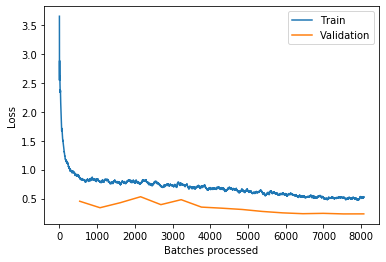

In [31]:
learn.recorder.plot_losses()

In [32]:
learn.save(EXPERIMENT_NAME, return_path=True)

PosixPath('results/effb4.fastai.mixeddata_0/effb4.fastai.mixeddata_0.pth')

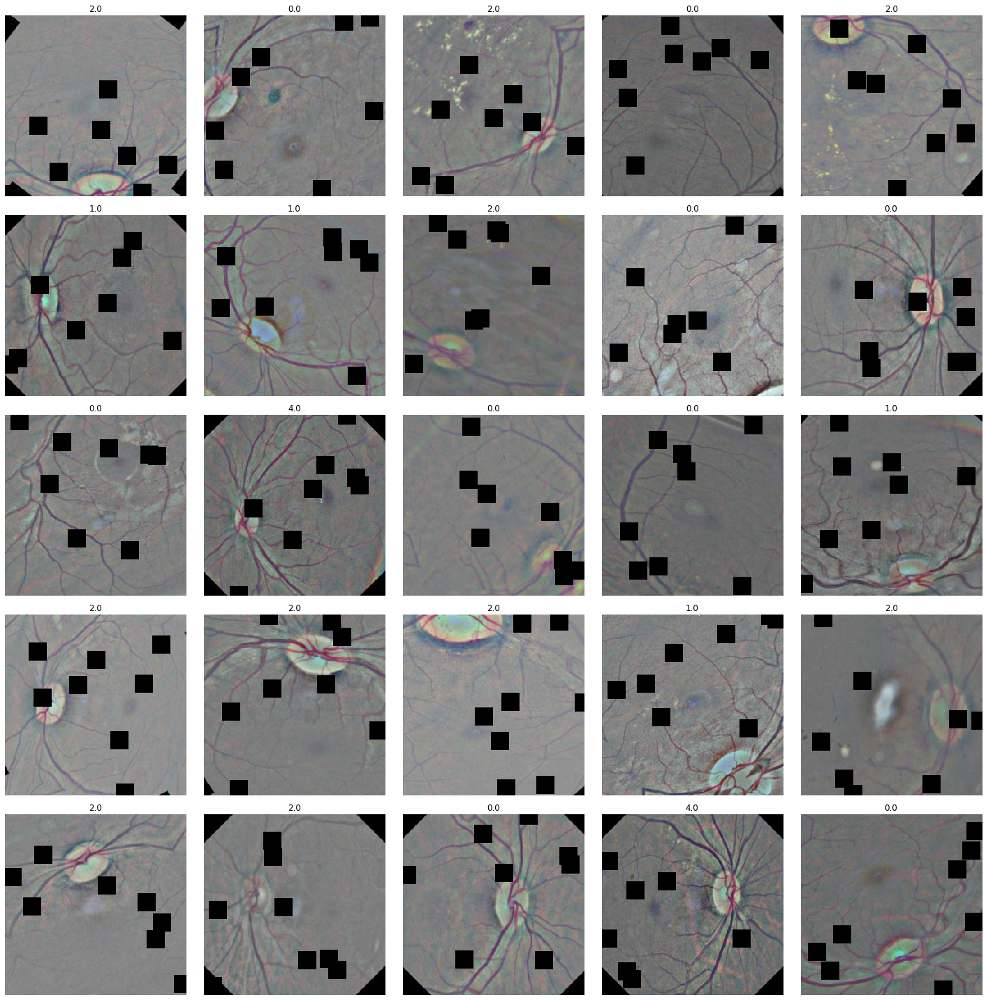

In [33]:
data.show_batch()

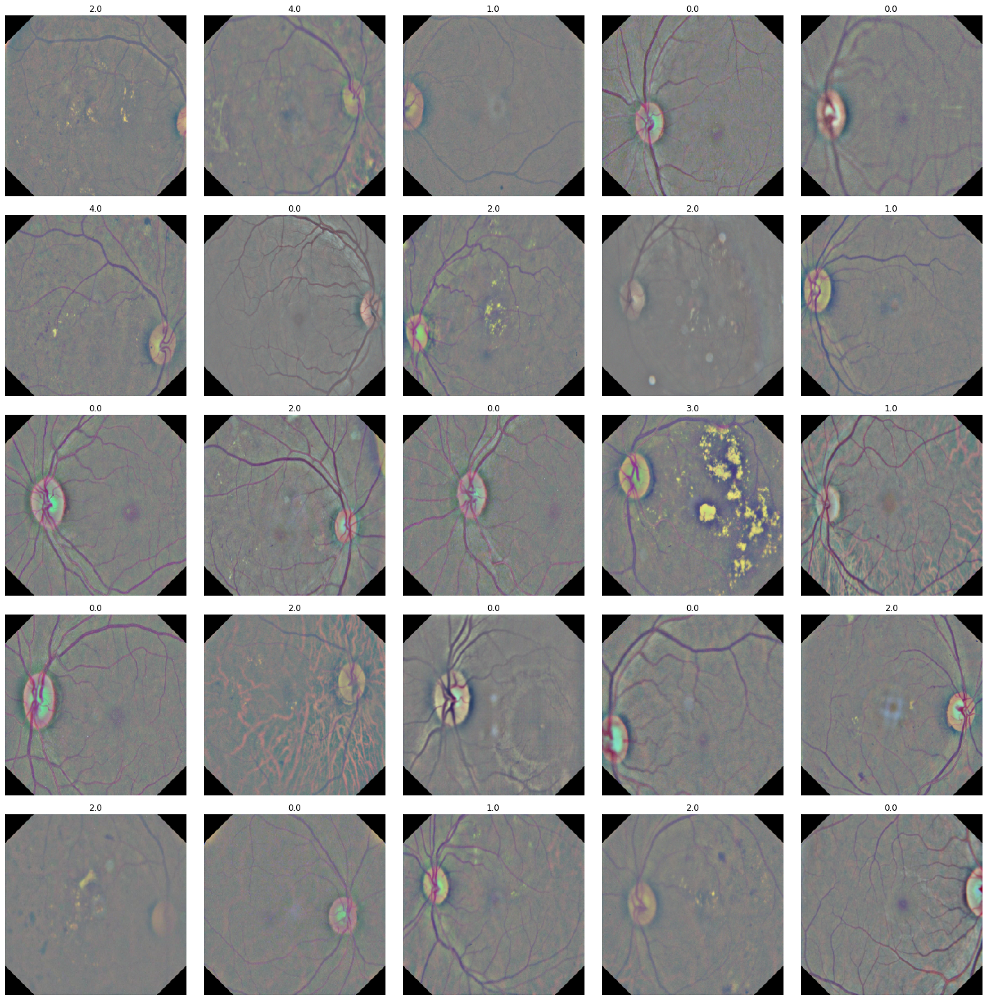

In [34]:
data.show_batch(ds_type=DatasetType.Valid)

### Submission

In [35]:
learn = learn.load('bestmodel1')

In [36]:
sample_df = pd.read_csv(os.path.join(DATA_DIR, 'sample_submission.csv'))
#sample_df = sample_df.rename(columns={'id_code': 'name', 'diagnosis': 'label'})
sample_df['path'] = sample_df['id_code'].apply(lambda x: os.path.join('data/test', x + '.png'))

In [23]:
# optlr -- 
# valid_preds = learn.get_preds(ds_type=DatasetType.Valid)
# optR = OptimizedRounder()
# optR.fit(valid_preds[0],valid_preds[1])
# coefficients = optR.coefficients()
# print(coefficients)

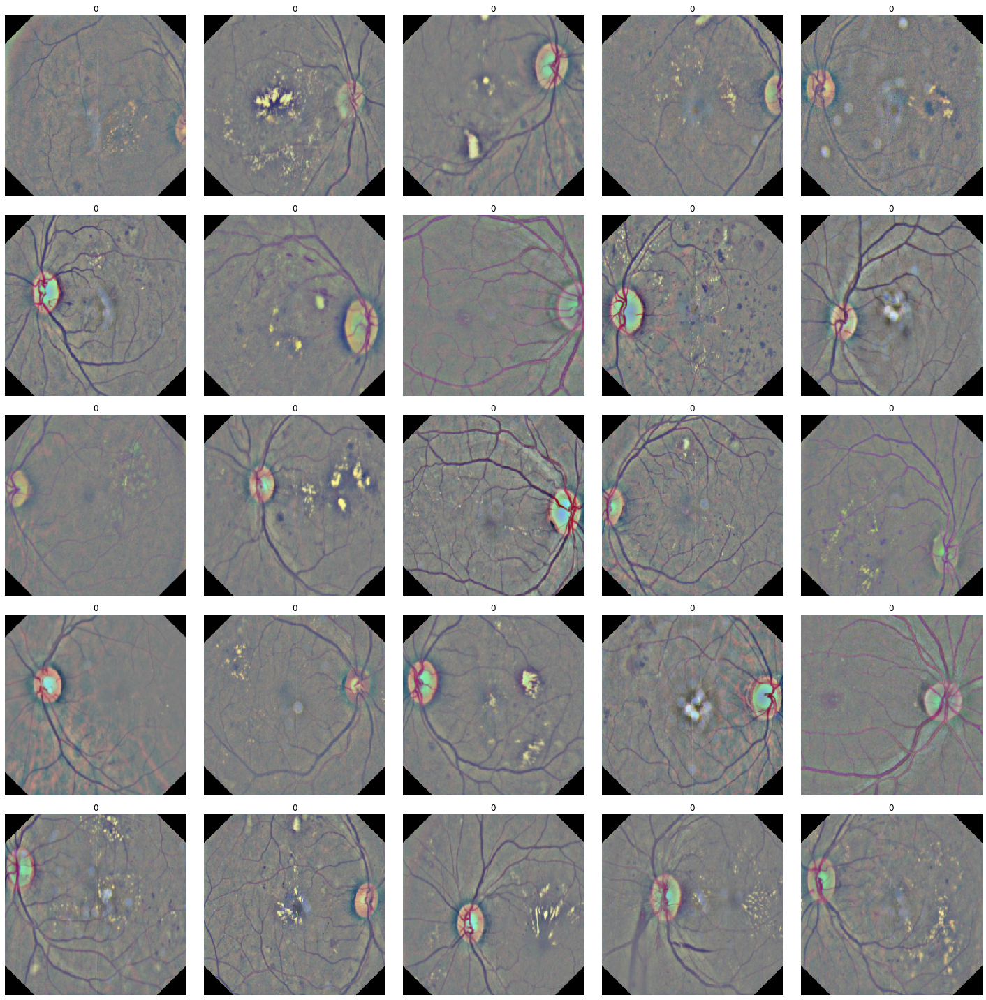

In [42]:
def _load_format(path, convert_mode, after_open)->Image:
    image = PILImage.open(path)
    image = transforms.ToTensor()(image)
    image = uncorr_transform(image)
    image = transforms.ToPILImage()(image)
                    
    return Image(pil2tensor(image, np.float32).div_(255)) #return fastai Image format

vision.data.open_image = _load_format
learn.data.add_test(ImageList.from_df(sample_df,path='',cols='path'))
data.show_batch(ds_type=DatasetType.Test)

In [43]:
preds,y = learn.get_preds(DatasetType.Test)
print(preds[:10])

tensor([[1.7520],
        [3.4238],
        [2.1914],
        [2.0449],
        [1.8809],
        [2.2285],
        [2.4785],
        [1.2744],
        [3.1777],
        [0.3125]])


In [44]:
preds_t = threshold_logits(preds)

In [45]:
sample_df.diagnosis = preds_t.astype(int)
sample_df.drop('path', axis=1, inplace=True)
sample_df.head(10)

,id_code,diagnosis
0,0005cfc8afb6,2
1,003f0afdcd15,3
2,006efc72b638,2
3,00836aaacf06,2
4,009245722fa4,2
5,009c019a7309,2
6,010d915e229a,2
7,0111b949947e,1
8,01499815e469,3
9,0167076e7089,0


In [46]:
sub_name = 'submission_{}.csv'.format(EXPERIMENT_NAME)
sample_df.to_csv(sub_name,index=False)

### Submission-TTA

In [42]:
model_path = 'bestmodel-808v7/bestmodel-808v7'
model = EfficientNet.from_pretrained('efficientnet-b4', num_classes=1) 
learn = Learner(data, model ,metrics=[quadratic_kappa],
                    model_dir=RESULTS_DIR) #.to_fp16()
learn = learn.load(model_path)

Loaded pretrained weights for efficientnet-b4


In [43]:
# remove zoom from FastAI TTA
tta_params = {'beta':0.4, 'scale':1.3}

In [44]:
sample_df = pd.read_csv(os.path.join(DATA_DIR, 'sample_submission.csv'))
#sample_df = sample_df.rename(columns={'id_code': 'name', 'diagnosis': 'label'})
sample_df['path'] = sample_df['id_code'].apply(lambda x: os.path.join('data/test', x + '.png'))

learn.data.add_test(ImageList.from_df(sample_df,path='',cols='path'))

In [45]:
preds,y = learn.TTA(ds_type=DatasetType.Test, **tta_params)

In [46]:
print(preds[:10]) #

tensor([[1.7018],
        [2.8623],
        [2.4320],
        [1.9240],
        [2.1280],
        [2.0941],
        [2.5910],
        [1.2495],
        [3.3073],
        [0.0742]])


In [47]:
preds_t = threshold_logits(preds)
sample_df.diagnosis = preds_t.astype(int)
sample_df.drop('path', axis=1, inplace=True)
sample_df.head()
sub_name = 'submission_{}.csv'.format(EXPERIMENT_NAME+'zoom')
sample_df.to_csv(sub_name,index=False)

In [48]:
sample_df.head(10)


,id_code,diagnosis
0,0005cfc8afb6,2
1,003f0afdcd15,3
2,006efc72b638,2
3,00836aaacf06,2
4,009245722fa4,2
5,009c019a7309,2
6,010d915e229a,3
7,0111b949947e,1
8,01499815e469,3
9,0167076e7089,0
